In [2]:
%cd "../.."

/home/ensai/projet-statistique-2022


In [154]:
from gensim import models
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import json
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.mixture import GaussianMixture as GMM
from sklearn.manifold import TSNE

import seaborn as sns
import plotly.express as px


from word_embedding.distance_wmd import *
import doc_embedding.moyenne as moyenne
from reduction_dim.correlation_matrix import *
import clustering.fit_clustering as CL 

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [137]:
with open('data/docs.json', encoding = "utf8") as f:
    docs = json.load(f)

dict_moy_embedding = {}
for modele in ["glove","cbow","skipgram"]:
    ev = models.KeyedVectors.load_word2vec_format(f"data/tunning/{modele}.kv")
    #Read moy matrix
    dict_moy_embedding[modele] = {}
    dict_moy_embedding[modele]["TF"] = moyenne.word_emb_vers_doc_emb_moyenne(docs, ev, methode = 'TF')
    dict_moy_embedding[modele]["TFIDF"] = moyenne.word_emb_vers_doc_emb_moyenne(docs, ev, methode = 'TF-IDF')

In [192]:
dict_wmd_embedding = {}
for modele in ["glove","cbow","skipgram"]:
    #Read moy matrix
    dict_wmd_embedding[modele] = {}
    dict_wmd_embedding[modele]["Distance"] = np.array(lecture_fichier_distances_wmd(f"distances_{modele}.7z"))
    if modele != "glove":
        dict_wmd_embedding[modele]["MDS"] = np.array(pd.read_csv(f"data/tunning/MDS/{modele}_mds_embedding.csv",sep=";",header=0))

In [4]:
df_gmm_clustering = pd.read_csv("data/tunning/clustering/gmm.csv",sep=";")
df_gmm_clustering.head()

,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
0,7,full,0.013844,2461.600641,-113284.663790,-0.801039,NaN,cbow,Moyenne,TF
1,9,full,-0.059354,2339.905689,-113239.922749,-0.799550,NaN,cbow,Moyenne,TF
2,8,full,-0.044807,1621.945520,-113237.248176,-0.805253,NaN,cbow,Moyenne,TF
3,11,full,-0.045682,1839.374929,-113216.156154,-0.775276,NaN,cbow,Moyenne,TF
4,10,full,-0.084101,1814.826214,-113177.498680,-0.765747,NaN,cbow,Moyenne,TF


# Avant Tsne

## Moyenne embedding

In [86]:
df_gmm_moy = df_gmm_clustering.loc[(df_gmm_clustering["docEmbedding"] == "Moyenne") & (df_gmm_clustering["perplexity"].isna())].reset_index()

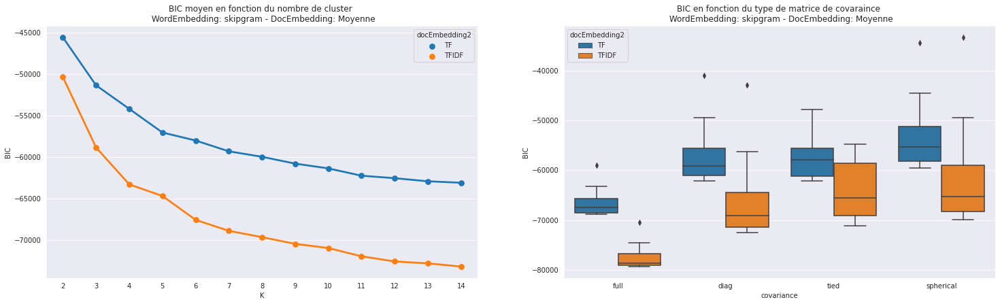

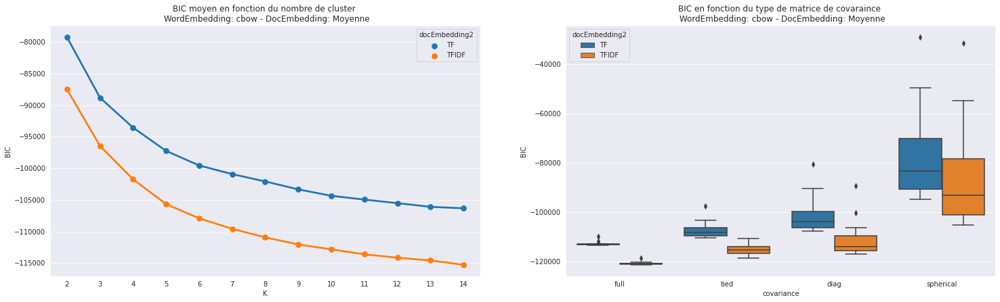

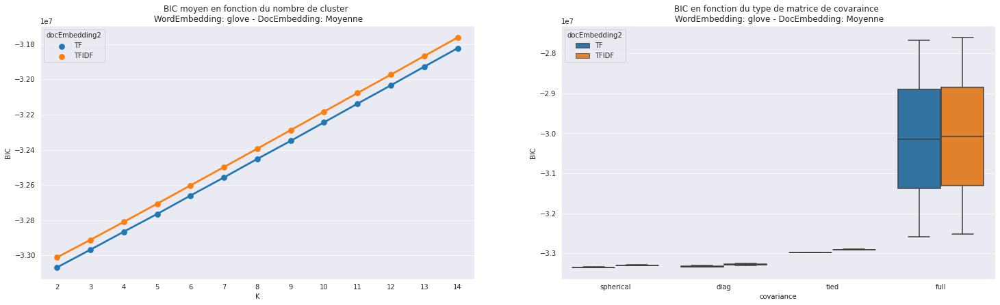

In [116]:
sns.set_style("darkgrid")
for modele in ["skipgram","cbow","glove"]:
    plt.figure(figsize = (25,15))
    sns.pointplot(data=df_gmm_moy[df_gmm_moy["wordEmbedding"]==modele],y="BIC",x="K",hue="docEmbedding2",ci=None,
        ax=plt.subplot(2,2,1,title=f"BIC moyen en fonction du nombre de cluster \n WordEmbedding: {modele} - DocEmbedding: Moyenne"))
    # sns.boxplot(data = df_gmm_moy[df_gmm_moy["wordEmbedding"]==modele],y="BIC",x="K",hue="docEmbedding2",ax=plt.subplot(2,2,1,title="K"))

    sns.boxplot(data=df_gmm_moy[df_gmm_moy["wordEmbedding"]==modele],y="BIC",x="covariance",hue="docEmbedding2",
        ax=plt.subplot(2,2,2,title=f"BIC en fonction du type de matrice de covaraince \n WordEmbedding: {modele} - DocEmbedding: Moyenne"))
    # sns.boxplot(data=df_gmm_moyTF,y="BIC",x="covariance",hue="wordEmbedding",ax=plt.subplot(2,2,2,title="covariance"))
    plt.show()

In [89]:
df_gmm_moy.loc[df_gmm_moy.groupby(["wordEmbedding"])["BIC"].idxmin()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
52,364,7,full,0.059492,3182.479263,-1.212796e+05,-0.738506,NaN,cbow,Moyenne,TFIDF
104,1404,5,spherical,0.125838,100.778053,-3.335620e+07,-0.712474,NaN,glove,Moyenne,TF
260,2808,13,full,0.049033,1825.336450,-7.928242e+04,-0.692505,NaN,skipgram,Moyenne,TFIDF


In [90]:
df_gmm_moy.loc[df_gmm_moy.groupby(["wordEmbedding"])["silhouette"].idxmax()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
103,415,2,spherical,0.507717,13919.439615,-3.164346e+04,-0.776836,NaN,cbow,Moyenne,TFIDF
167,1779,2,diag,0.418284,59.252895,-3.329810e+07,-0.265205,NaN,glove,Moyenne,TFIDF
308,2856,2,tied,0.665797,2705.997782,-5.474153e+04,-0.582056,NaN,skipgram,Moyenne,TFIDF


## WMD

In [82]:
df_gmm_wmd = df_gmm_clustering.loc[(df_gmm_clustering["docEmbedding"] == "WMD") & (df_gmm_clustering["perplexity"].isna())].reset_index()

<AxesSubplot:title={'center':'WMD MDS'}, xlabel='covariance', ylabel='BIC'>

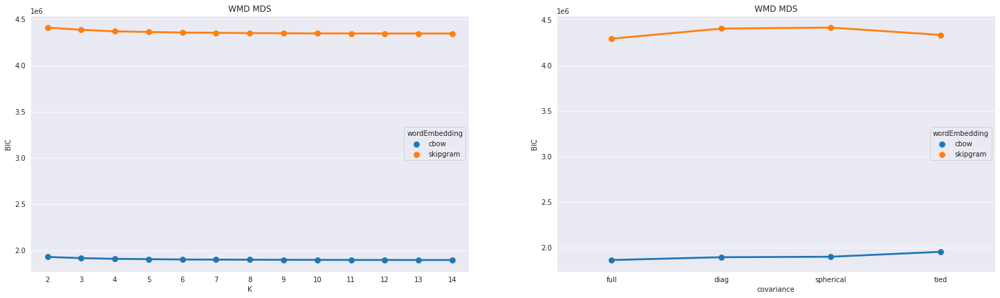

In [70]:
sns.set_style("darkgrid")
plt.figure(figsize = (25,15))
df_gmm_wmdMDS = df_gmm_wmd[df_gmm_wmd["docEmbedding2"]=="MDS"]

sns.pointplot(data=df_gmm_wmdMDS,y="BIC",x="K",hue="wordEmbedding",ci=None, ax=plt.subplot(2,2,1,title="WMD MDS"))
# sns.boxplot(data = df_gmm_moyTF,y="BIC",x="K",hue="wordEmbedding",ax=plt.subplot(2,2,1,title="K"))

sns.pointplot(data=df_gmm_wmdMDS,y="BIC",x="covariance",hue="wordEmbedding",ci=None, ax=plt.subplot(2,2,2,title="WMD MDS"))
# sns.boxplot(data=df_gmm_moyTF,y="BIC",x="covariance",hue="wordEmbedding",ax=plt.subplot(2,2,2,title="covariance"))

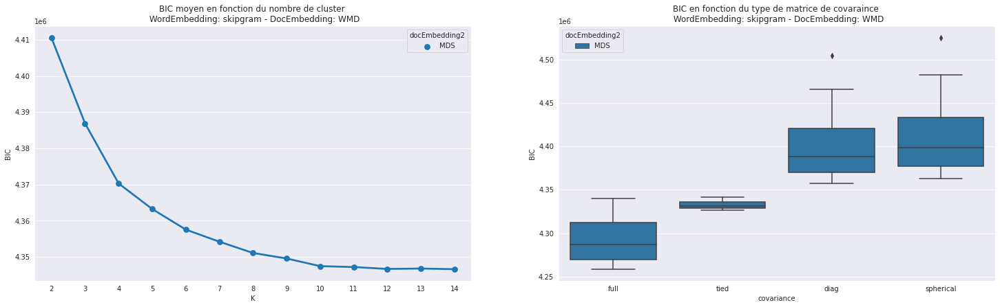

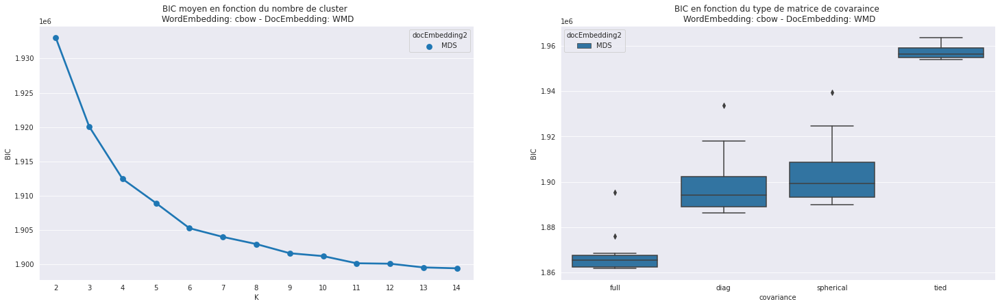

In [126]:
sns.set_style("darkgrid")
for modele in ["skipgram","cbow"]:
    plt.figure(figsize = (25,15))
    sns.pointplot(data=df_gmm_wmd[df_gmm_wmd["wordEmbedding"]==modele],y="BIC",x="K",hue="docEmbedding2",ci=None,
        ax=plt.subplot(2,2,1,title=f"BIC moyen en fonction du nombre de cluster \n WordEmbedding: {modele} - DocEmbedding: WMD"))
    # sns.boxplot(data = df_gmm_moy[df_gmm_moy["wordEmbedding"]==modele],y="BIC",x="K",hue="docEmbedding2",ax=plt.subplot(2,2,1,title="K"))

    sns.boxplot(data=df_gmm_wmd[df_gmm_wmd["wordEmbedding"]==modele],y="BIC",x="covariance",hue="docEmbedding2",
        ax=plt.subplot(2,2,2,title=f"BIC en fonction du type de matrice de covaraince \n WordEmbedding: {modele} - DocEmbedding: WMD"))
    # sns.boxplot(data=df_gmm_moyTF,y="BIC",x="covariance",hue="wordEmbedding",ax=plt.subplot(2,2,2,title="covariance"))
    plt.show()

In [88]:
df_gmm_wmd.loc[df_gmm_wmd.groupby("wordEmbedding")["BIC"].idxmin()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
0,728,8,full,-0.110894,269.982137,1.861913e+06,-0.490757,NaN,cbow,WMD,MDS
52,3172,3,full,-0.006289,239.813633,4.258660e+06,-0.417439,NaN,skipgram,WMD,MDS


In [87]:
df_gmm_wmd.loc[df_gmm_wmd.groupby(["wordEmbedding","docEmbedding2"])["silhouette"].idxmax()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
51,779,2,tied,0.309662,978.347415,1.963595e+06,-0.626110,NaN,cbow,WMD,MDS
77,3197,2,tied,0.383654,2147.307636,4.341957e+06,-0.667619,NaN,skipgram,WMD,MDS


# Avec TSNE

## Moyenne

In [194]:
df_gmm_moy2 = df_gmm_clustering.loc[(df_gmm_clustering["docEmbedding"] == "Moyenne") & (df_gmm_clustering["perplexity"].notna())].reset_index()

In [195]:
df_gmm_moy2.loc[df_gmm_moy2.groupby(["wordEmbedding","docEmbedding"])["silhouette"].idxmax()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
610,714,3,full,0.514020,14089.783315,154273.015316,-0.632999,200.0,cbow,Moyenne,TFIDF
723,1555,3,spherical,0.382828,7531.152914,174574.614217,-0.874039,75.0,glove,Moyenne,TF
1870,3170,2,diag,0.493039,12947.772932,161156.436097,-0.577367,200.0,skipgram,Moyenne,TFIDF


In [196]:
df_gmm_moy2.loc[df_gmm_moy2.groupby(["wordEmbedding","docEmbedding"])["BIC"].idxmin()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
572,676,14,full,0.374882,20402.724174,148203.399000,-0.597088,200.0,cbow,Moyenne,TFIDF
1196,2080,10,full,0.306611,5381.949530,94941.986936,-0.657510,200.0,glove,Moyenne,TFIDF
1508,2756,14,full,0.351409,10551.681468,154306.688471,-0.549786,200.0,skipgram,Moyenne,TF


## WMD

In [198]:
df_gmm_wmd2 = df_gmm_clustering.loc[(df_gmm_clustering["docEmbedding"] == "WMD") & (df_gmm_clustering["perplexity"].notna())].reset_index()

In [199]:
df_gmm_wmd2.loc[df_gmm_wmd2.groupby(["wordEmbedding","docEmbedding"])["silhouette"].idxmax()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
411,1191,3,spherical,0.418433,8923.536970,180179.763974,-0.877154,75.0,cbow,WMD,Distance
926,2434,3,full,0.394457,8030.912467,158977.981824,-0.831220,200.0,glove,WMD,Distance
1195,3483,2,spherical,0.467767,12258.367026,146958.796874,-0.805287,150.0,skipgram,WMD,MDS


In [200]:
df_gmm_wmd2.loc[df_gmm_wmd2.groupby(["wordEmbedding","docEmbedding"])["BIC"].idxmin()]

,index,K,covariance,silhouette,Cal-Harabasz,BIC,DBCV,perplexity,wordEmbedding,docEmbedding,docEmbedding2
260,1040,14,full,0.354321,8963.111538,135141.256199,-0.642460,200.0,cbow,WMD,MDS
884,2392,13,diag,0.343957,8312.567488,157728.849426,-0.781775,200.0,glove,WMD,Distance
1196,3484,14,full,0.356543,10424.176266,134189.267290,-0.638906,200.0,skipgram,WMD,MDS


# Plot ScatterPlot

In [223]:
def plot_gmm(df_gmm,dict_embedding,gmm_metric="BIC",first_reduce=False,modele="cbow"):
    best_model = df_gmm.loc[df_gmm.groupby(["wordEmbedding"])[gmm_metric].idxmin()] if gmm_metric == "BIC" else df_gmm.loc[df_gmm.groupby(["wordEmbedding"])[gmm_metric].idxmax()]
    best_model = best_model[best_model["wordEmbedding"]==modele]

    if len(best_model) > 0:
        tsne_metric = "precomputed" if best_model["docEmbedding2"].values[0] == "Distance" else "euclidean"


        doc_embedding = dict_embedding[modele]

        tsne = TSNE(n_components = 2, perplexity=200, n_iter=2000, random_state=0,metric=tsne_metric)

        tsne_embedding = tsne.fit_transform(doc_embedding[best_model["docEmbedding2"].values[0]])
        gmm_model = GMM(n_components=best_model["K"].values[0],covariance_type=best_model["covariance"].values[0])
        gmm_data = tsne_embedding if first_reduce else doc_embedding[best_model["docEmbedding2"].values[0]]
        labels = gmm_model.fit_predict(gmm_data)

        color_palette = sns.color_palette('Paired', len(np.unique(labels)))
        cluster_colors = [color_palette[x] for x in labels]

        title = f"Best Doc embedding GMM Clustering based on {gmm_metric}"
        subtitle1 = f"WordEmbedding: {modele} - Origin: {best_model['docEmbedding'].values[0]} {best_model['docEmbedding2'].values[0]} - First Reduce: {first_reduce} - Number of cluster: {len(np.unique(labels))}"
        subtitle2 = f"BIC: {round(best_model['BIC'].values[0])} - Silhouette: {round(best_model['silhouette'].values[0],2)}"
        title=f"{title}\n{subtitle1}\n{subtitle2}"


        return labels,tsne_embedding, cluster_colors, title
    else: 
        return [None, None,None,None]

## Moyenne Embedding

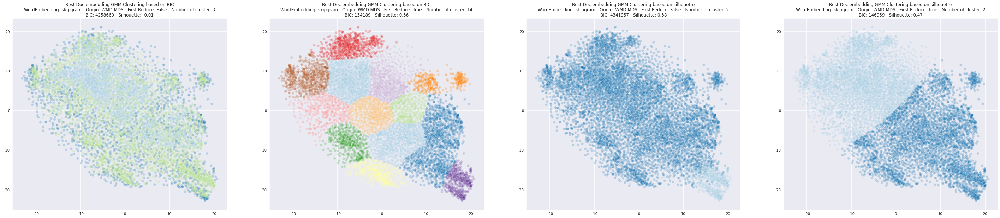

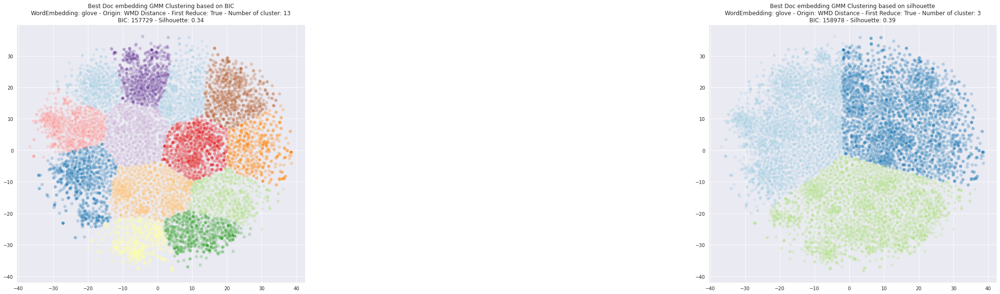

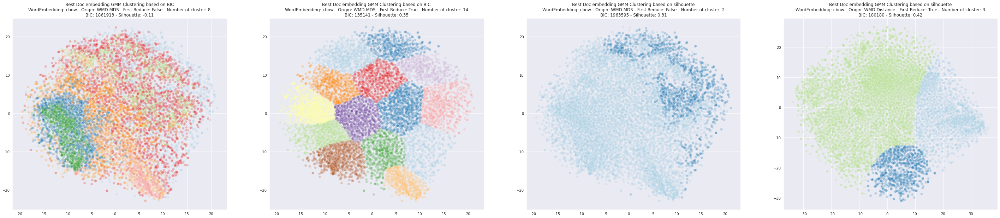

In [221]:
for modele in ["skipgram","glove","cbow"]:
    # BIC
    labels_bic, tsne_wmd_bic, bic_colors, bic_title = plot_gmm(df_gmm_wmd,dict_wmd_embedding,gmm_metric="BIC",first_reduce=False,modele=modele)
    labels_bic2, tsne_wmd_bic2, bic_colors2, bic_title2 = plot_gmm(df_gmm_wmd2,dict_wmd_embedding,gmm_metric="BIC",first_reduce=True,modele=modele)
    #Silhouette
    labels_silhouette, tsne_wmd_silhouette, silhouette_colors, silhouette_title = plot_gmm(df_gmm_wmd,dict_wmd_embedding,gmm_metric="silhouette",first_reduce=False,modele=modele)
    labels_silhouette2, tsne_wmd_silhouette2, silhouette_colors2, silhouette_title2 = plot_gmm(df_gmm_wmd2,dict_wmd_embedding,gmm_metric="silhouette",first_reduce=True,modele=modele)

    #Plot
    plt.figure(figsize = (50,10))
    if bic_title is not None:
        sns.scatterplot(tsne_wmd_bic[:,0],tsne_wmd_bic[:,1], s=50, c=bic_colors, alpha=0.25,ax=plt.subplot(1,4,1,title=bic_title))
    sns.scatterplot(tsne_wmd_bic2[:,0],tsne_wmd_bic2[:,1], s=50, c=bic_colors2, alpha=0.25,ax=plt.subplot(1,4,2,title=bic_title2))
    
    if silhouette_title is not None:
        sns.scatterplot(tsne_wmd_silhouette[:,0],tsne_wmd_silhouette[:,1], s=50, c=silhouette_colors, alpha=0.25,ax=plt.subplot(1,4,3,title=silhouette_title))
    sns.scatterplot(tsne_wmd_silhouette2[:,0],tsne_wmd_silhouette2[:,1], s=50, c=silhouette_colors2, alpha=0.25,ax=plt.subplot(1,4,4,title=silhouette_title2))

    plt.show()

## Moyenne Embedding

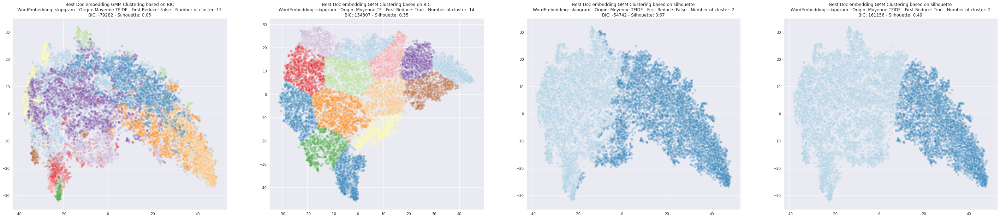

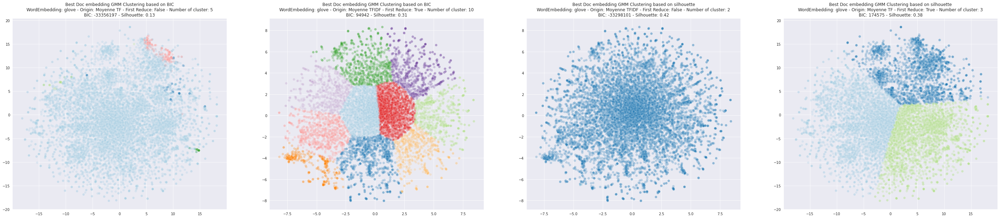

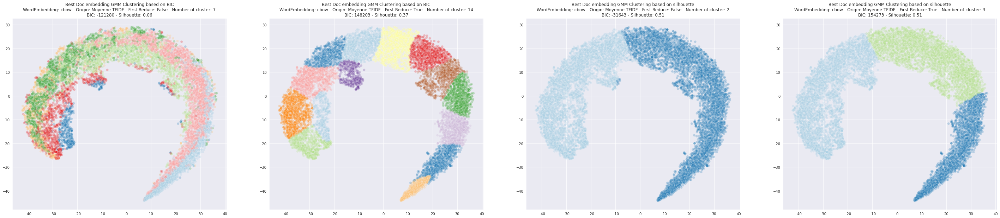

In [224]:
for modele in ["skipgram","glove","cbow"]:
    # BIC
    labels_bic, tsne_wmd_bic, bic_colors, bic_title = plot_gmm(df_gmm_moy,dict_moy_embedding,gmm_metric="BIC",first_reduce=False,modele=modele)
    labels_bic2, tsne_wmd_bic2, bic_colors2, bic_title2 = plot_gmm(df_gmm_moy2,dict_moy_embedding,gmm_metric="BIC",first_reduce=True,modele=modele)
    #Silhouette
    labels_silhouette, tsne_wmd_silhouette, silhouette_colors, silhouette_title = plot_gmm(df_gmm_moy,dict_moy_embedding,gmm_metric="silhouette",first_reduce=False,modele=modele)
    labels_silhouette2, tsne_wmd_silhouette2, silhouette_colors2, silhouette_title2 = plot_gmm(df_gmm_moy2,dict_moy_embedding,gmm_metric="silhouette",first_reduce=True,modele=modele)

    #Plot
    plt.figure(figsize = (50,10))
    if bic_title is not None:
        sns.scatterplot(tsne_wmd_bic[:,0],tsne_wmd_bic[:,1], s=50, c=bic_colors, alpha=0.25,ax=plt.subplot(1,4,1,title=bic_title))
    sns.scatterplot(tsne_wmd_bic2[:,0],tsne_wmd_bic2[:,1], s=50, c=bic_colors2, alpha=0.25,ax=plt.subplot(1,4,2,title=bic_title2))
    
    if silhouette_title is not None:
        sns.scatterplot(tsne_wmd_silhouette[:,0],tsne_wmd_silhouette[:,1], s=50, c=silhouette_colors, alpha=0.25,ax=plt.subplot(1,4,3,title=silhouette_title))
    sns.scatterplot(tsne_wmd_silhouette2[:,0],tsne_wmd_silhouette2[:,1], s=50, c=silhouette_colors2, alpha=0.25,ax=plt.subplot(1,4,4,title=silhouette_title2))

    plt.show()